In [4]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [5]:
# def crop(img, ax0_min, ax0_max, ax1_min, ax1_max):
#     ax0_size = ax0_max - ax0_min
#     ax1_size = ax1_max - ax1_min
#     ax0_start = int(max(0, ax0_min - ax0_size*2))
#     ax1_start = int(max(0, ax1_min - ax1_size*2))
#     cropped = img[ax0_start: ax0_start + ax0_size *
#                   5, ax1_start: ax1_start + ax1_size*5]

In [6]:
filename = '../csv_detection_info/20_1, artrose.csv'
filename_clean = '../csv_detection_info_clean/20_1, artrose.csv'
saved_cropped_image = '//nmbu.no/LargeFile/Project/CubiAI/preprocess/cropped/20/1, artrose'

In [7]:
detection_df = pd.read_csv(filename)

In [8]:
detection_df

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,year,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.7230010.3.0.3.5.1.11606741.233348646...,529,685,739,896,1.000000,20,1,"1, artrose"
1,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,1613,1743,1837,1967,0.778734,20,1,"1, artrose"
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,1741,1871,1777,1906,0.352781,20,1,"1, artrose"
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1216030460.10.0.0.10.636...,0,0,0,0,0.000000,20,1,"1, artrose"
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1216030460.10.0.0.10.652...,1458,1605,711,857,0.997802,20,1,"1, artrose"
...,...,...,...,...,...,...,...,...,...,...
298,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.740421428.21158.23624.42703.59824.9...,471,638,471,637,1.000000,20,1,"1, artrose"
299,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.76347641.17825.11598.39714.58584.60...,741,868,1121,1248,0.999233,20,1,"1, artrose"
300,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.829111129.29129.13131.39346.43861.3...,1469,1676,1514,1721,0.999164,20,1,"1, artrose"
301,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.876694617.60590.12865.38444.64377.4...,433,598,736,901,0.999418,20,1,"1, artrose"


### [Optional] Sort by confidence (filter out bad prediction)

In [9]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [10]:
detection_df[detection_df.confidence < 0.5]

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,year,diagnosis,diagnosis_raw
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.669053978.192.168.20.208...,1741,1871,1777,1906,0.352781,20,1,"1, artrose"
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1216030460.10.0.0.10.636...,0,0,0,0,0.000000,20,1,"1, artrose"
41,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.28994.20200717.133853.0.dcm,0,0,0,0,0.000000,20,1,"1, artrose"
42,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.28994.20200717.134058.0.dcm,0,0,0,0,0.000000,20,1,"1, artrose"
43,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.28994.20200717.134135.0.dcm,1377,1527,1564,1712,0.413085,20,1,"1, artrose"
44,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.28994.20200717.134806.0.dcm,0,0,0,0,0.000000,20,1,"1, artrose"
46,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.28994.20200717.135233.0.dcm,1378,1520,1606,1747,0.447922,20,1,"1, artrose"
99,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.32121.20201008.165123.0.dcm,0,0,0,0,0.000000,20,1,"1, artrose"
114,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.32301.1.20200818.172639.0.2.306.dcm,508,654,1166,1311,0.322478,20,1,"1, artrose"
210,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.13618288403.46245.54339.38846.13321...,486,631,1220,1367,0.320402,20,1,"1, artrose"


Note that there is one case that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [11]:
# plot every 9 of them

C:\NMBU\TEMP\ipykernel_2096\89006417.py:5: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')
C:\NMBU\TEMP\ipykernel_2096\89006417.py:5: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')


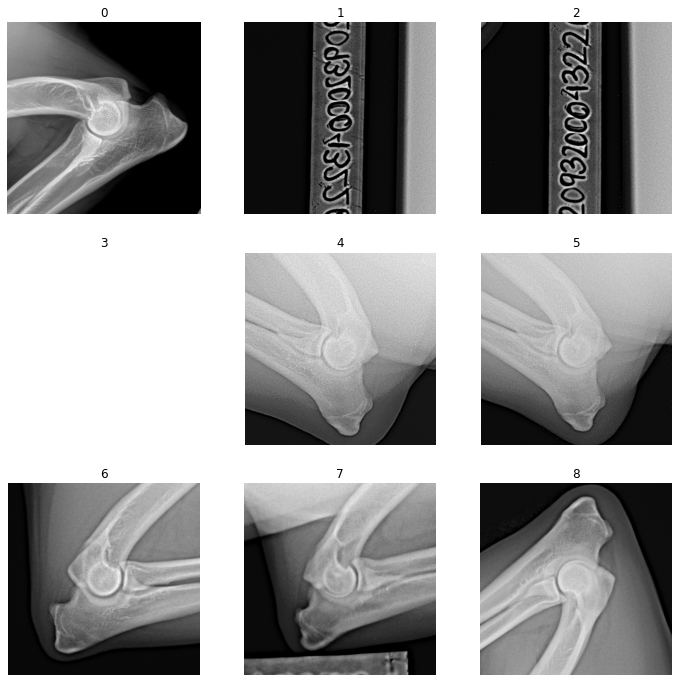

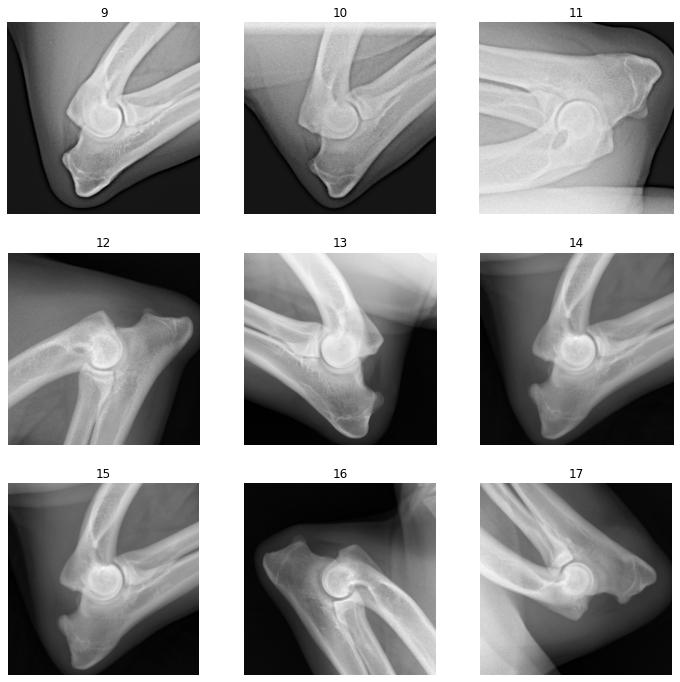

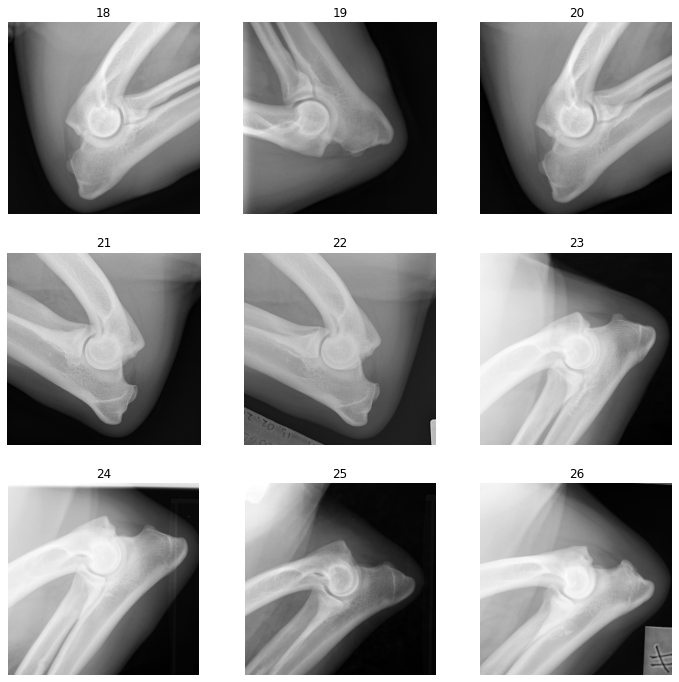

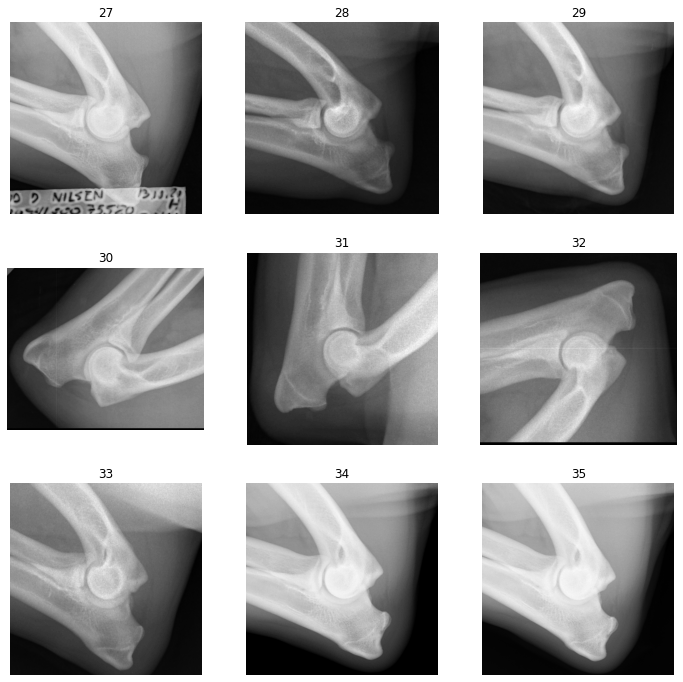

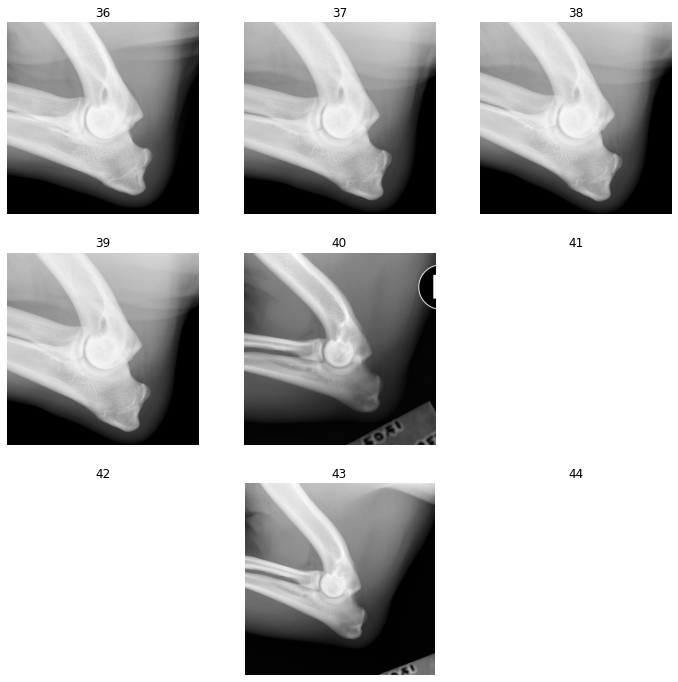

...

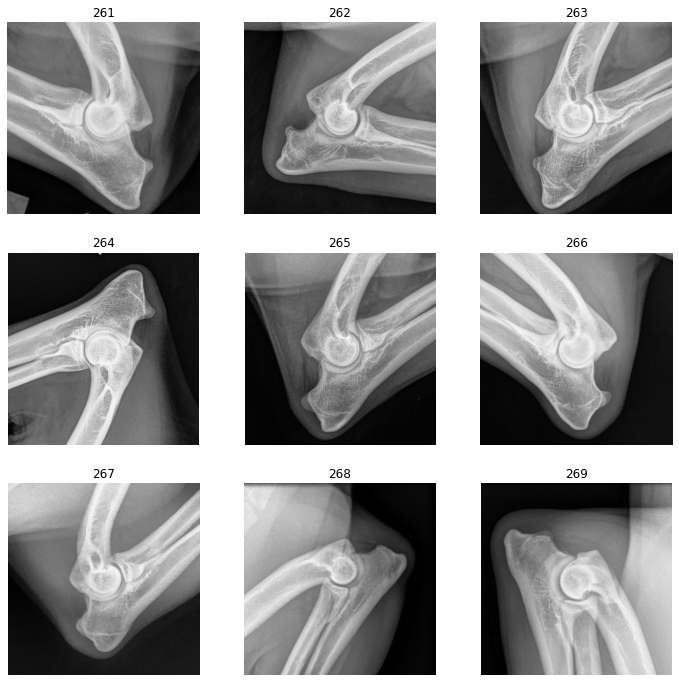

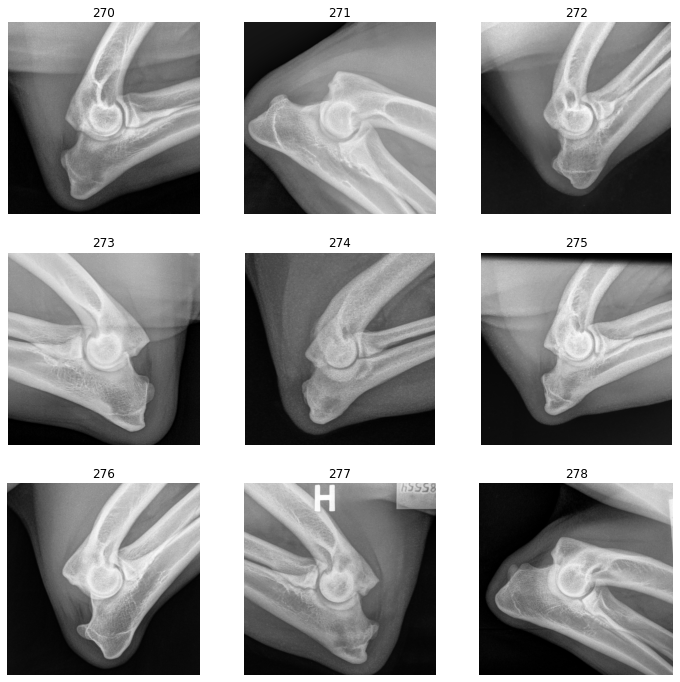

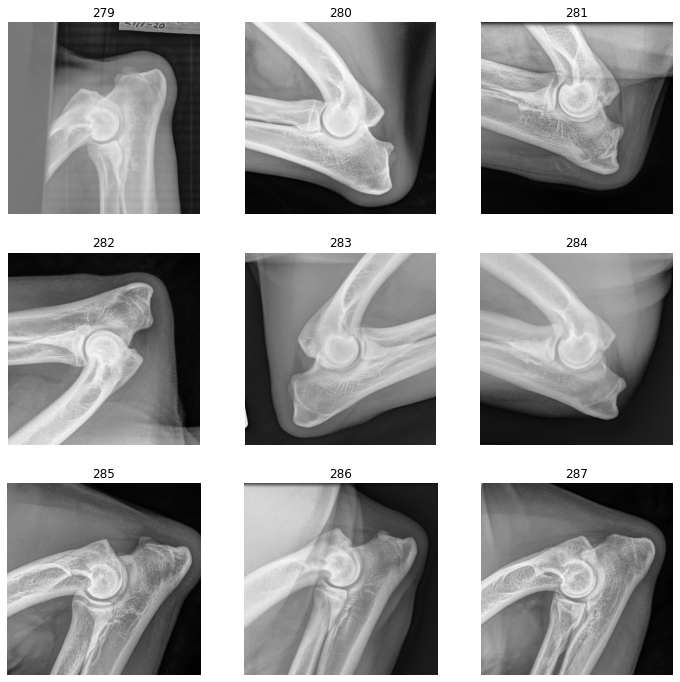

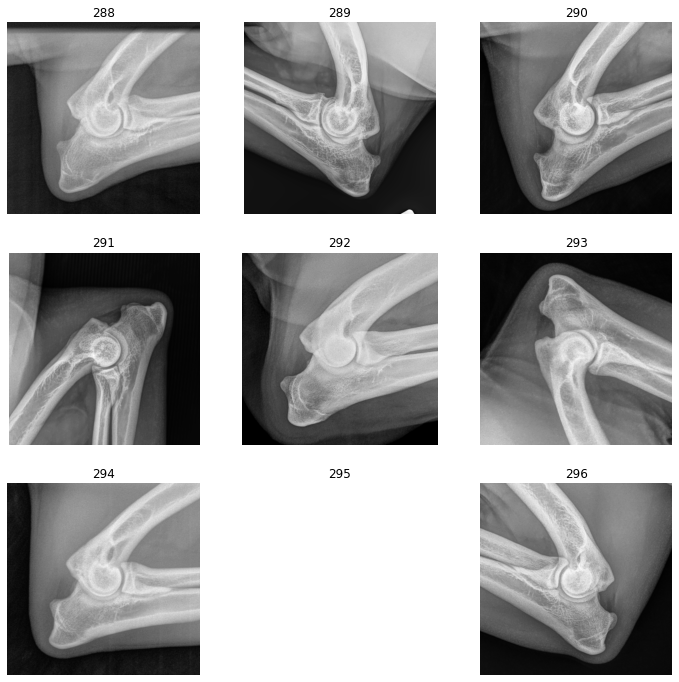

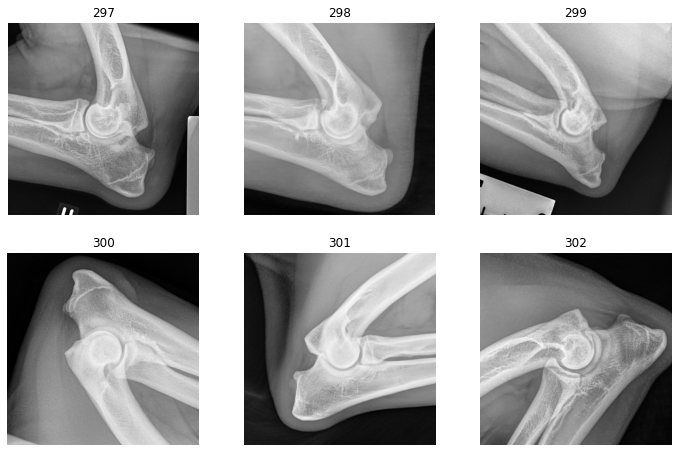

In [12]:
for id, item in detection_df.iterrows():
    fn = item['filename']
    img = np.load(saved_cropped_image + '/' + fn + '.npy')
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id))
    
    if (id%9) == 8:
        plt.show()
        
plt.show()

## Remove bad detection items

In [16]:
remove_indice = [1,2,3,41,42,44,99,249,295]
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,year,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.7230010.3.0.3.5.1.11606741.233348646...,529,685,739,896,1.000000,20,1,"1, artrose"
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1216030460.10.0.0.10.652...,1458,1605,711,857,0.997802,20,1,"1, artrose"
5,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1216030460.10.0.0.10.652...,1616,1771,1337,1491,0.998693,20,1,"1, artrose"
6,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.1889686144.192.168.5.168...,1467,1641,1614,1788,0.999998,20,1,"1, artrose"
7,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1430.332813960.192.168.1.110....,1287,1424,1436,1573,0.999963,20,1,"1, artrose"
...,...,...,...,...,...,...,...,...,...,...
298,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.740421428.21158.23624.42703.59824.9...,471,638,471,637,1.000000,20,1,"1, artrose"
299,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.76347641.17825.11598.39714.58584.60...,741,868,1121,1248,0.999233,20,1,"1, artrose"
300,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.829111129.29129.13131.39346.43861.3...,1469,1676,1514,1721,0.999164,20,1,"1, artrose"
301,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.876694617.60590.12865.38444.64377.4...,433,598,736,901,0.999418,20,1,"1, artrose"


In [17]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [18]:
new_detection_df.to_csv(filename_clean, index=False)